# Loading Required Libraries

In [10]:
import pandas as pd
import numpy as np
import zipfile
import os
import glob
import random
import sys
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import pydicom
import cv2
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.patches as mpatches
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from PIL import Image

In [15]:
from utility_functions import rle2mask,mask2rle, plot_train
from utility_functions import dice_coef, dicom_to_dict,plot_with_mask_and_bbox,boundingbox,dice_coef
from gen import DataGenerator

In [3]:
IMG_WIDTH       = 256
IMG_HEIGHT      = 256
IMG_CHANNELS    = 1 #3

print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)

print('Tensorflow   :', tf.__version__)

Python       : 3.10.9 | packaged by Anaconda, Inc. | (main, Mar  1 2023, 18:18:15) [MSC v.1916 64 bit (AMD64)]
Numpy        : 1.23.5
Tensorflow   : 2.12.0


# Loading and creating data from files

In [4]:
# load rle data 
mask_df = pd.read_csv('train-rle.csv')
mask_df.columns = ['ImageId', 'EncodedPixels']

In [5]:
# create a list of all the files
train_fns = sorted(glob.glob('dicom-images-train/*/*/*.dcm'))
# converting dicom files to metadata
train_metadata_df = pd.DataFrame()
train_metadata_list = []
for file_path in tqdm(train_fns):
    dicom_data = pydicom.dcmread(file_path)
    train_metadata = dicom_to_dict(dicom_data, file_path, mask_df)
    train_metadata_list.append(train_metadata)
train_metadata_df = pd.DataFrame(train_metadata_list)

100%|███████████████████████████████████████████████████████████████████████████| 10712/10712 [00:54<00:00, 196.49it/s]


In [6]:
# create a list of all the files
test_fns = sorted(glob.glob('dicom-images-test/*/*/*.dcm'))
# parse test DICOM dataset
test_metadata_df = pd.DataFrame()
test_metadata_list = []
for file_path in tqdm(test_fns):
    dicom_data = pydicom.dcmread(file_path)
    test_metadata = dicom_to_dict(dicom_data, file_path, mask_df, encoded_pixels=False)
    test_metadata_list.append(test_metadata)
test_metadata_df = pd.DataFrame(test_metadata_list)

100%|█████████████████████████████████████████████████████████████████████████████| 1377/1377 [00:03<00:00, 355.33it/s]


# Data Visualization

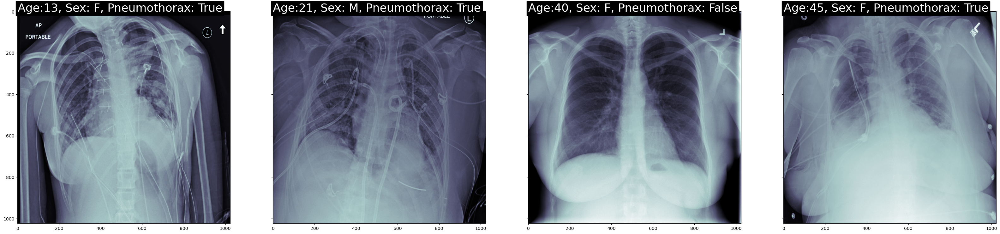

In [7]:
num_img = 4
subplot_count = 0
fig, ax = plt.subplots(nrows=1, ncols=num_img, sharey=True, figsize=(num_img*10,10))
for index, row in train_metadata_df.sample(n=num_img).iterrows():
    dataset = pydicom.dcmread(row['file_path'])
    ax[subplot_count].imshow(dataset.pixel_array, cmap=plt.cm.bone)
    # label the x-ray with information about the patient
    ax[subplot_count].text(0,0,'Age:{}, Sex: {}, Pneumothorax: {}'.format(row['patient_age'],row['patient_sex'],row['has_pneumothorax']),
                           size=26,color='white', backgroundcolor='black')
    subplot_count += 1

image id: 1.2.276.0.7230010.3.1.4.8323329.13666.1517875247.117800


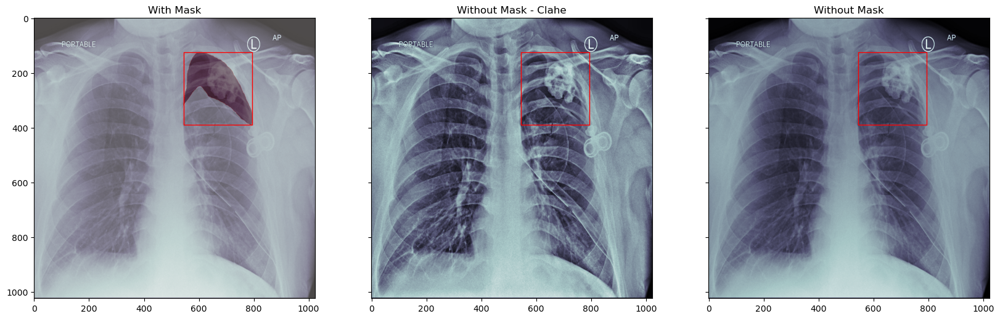

image id: 1.2.276.0.7230010.3.1.4.8323329.574.1517875163.503792


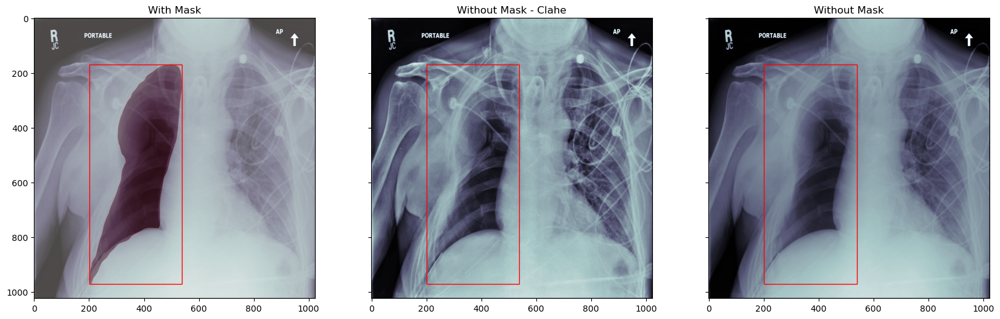

image id: 1.2.276.0.7230010.3.1.4.8323329.2597.1517875173.653909


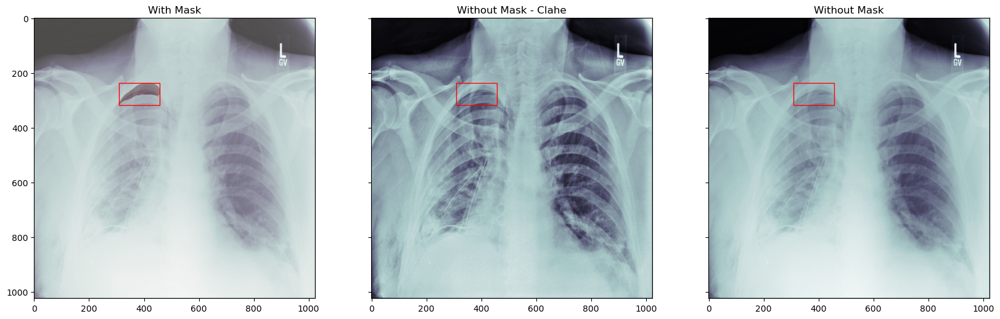

image id: 1.2.276.0.7230010.3.1.4.8323329.11054.1517875230.504403


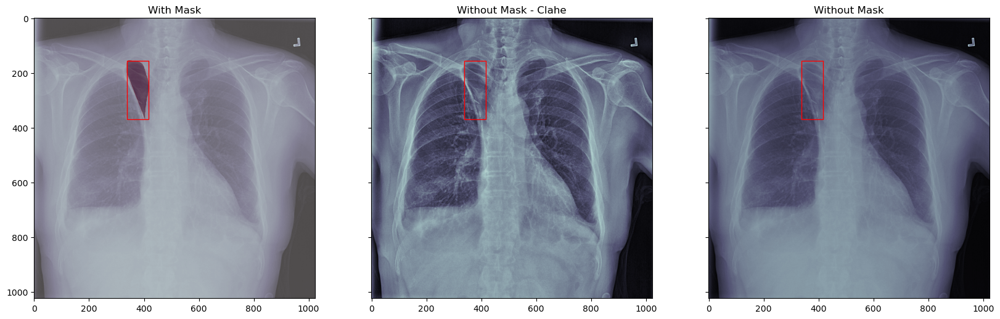

image id: 1.2.276.0.7230010.3.1.4.8323329.4615.1517875183.748198


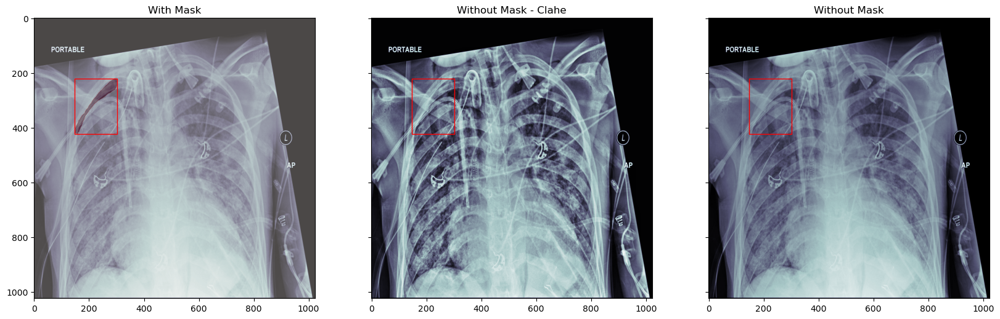

image id: 1.2.276.0.7230010.3.1.4.8323329.12133.1517875237.603189


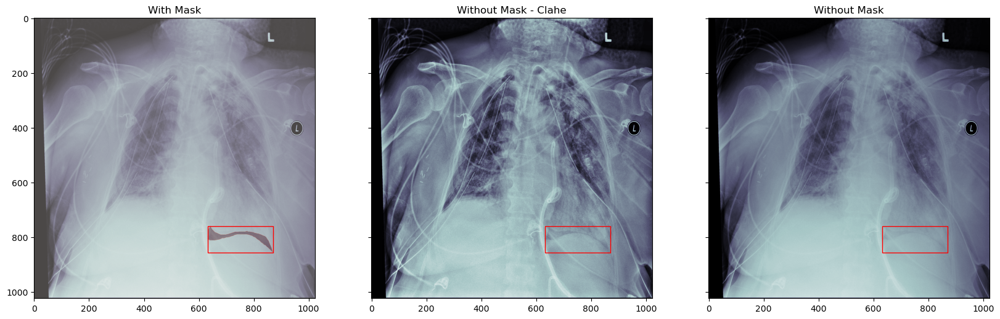

image id: 1.2.276.0.7230010.3.1.4.8323329.4997.1517875185.898581


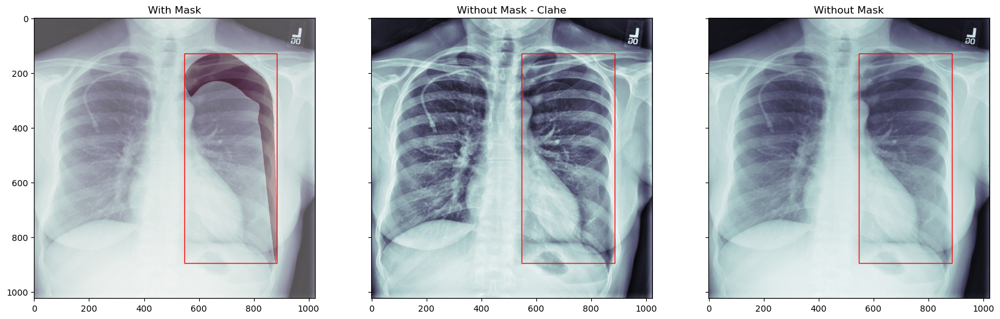

image id: 1.2.276.0.7230010.3.1.4.8323329.3204.1517875176.582850


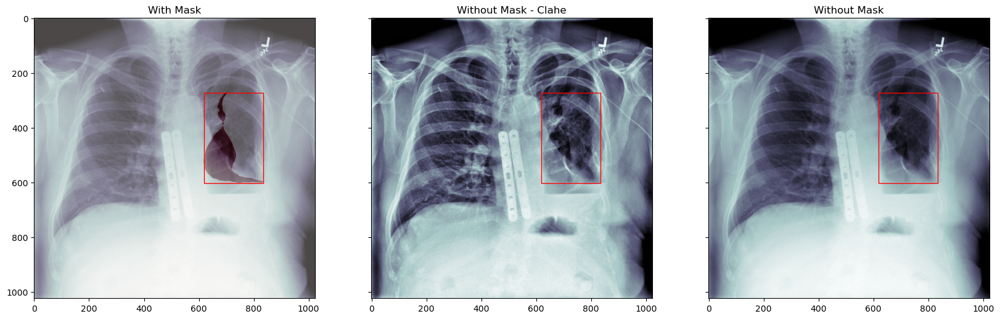

image id: 1.2.276.0.7230010.3.1.4.8323329.11499.1517875233.225362


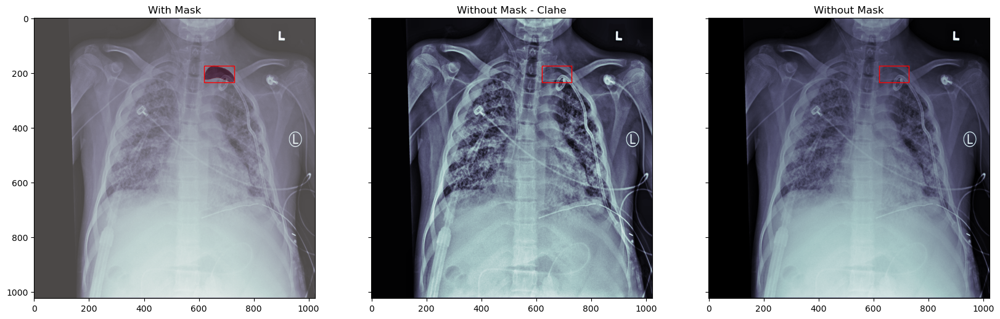

image id: 1.2.276.0.7230010.3.1.4.8323329.11002.1517875229.349676


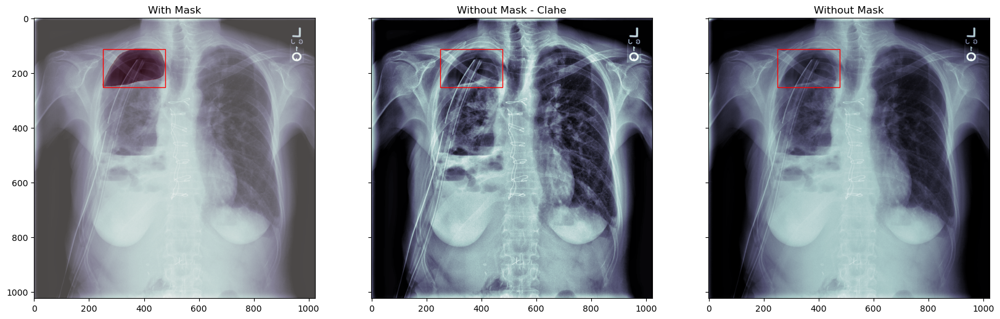

In [8]:
# Taking 10 random samples of x-rays
train_metadata_sample = train_metadata_df[train_metadata_df['has_pneumothorax']==1].sample(n=10)
# plot ten xrays with and without mask
for index, row in train_metadata_sample.iterrows():
    file_path = row['file_path']
    mask_encoded_list = row['encoded_pixels_list']
    print('image id: ' + row['id'])
    plot_with_mask_and_bbox(file_path, mask_encoded_list)

<Axes: xlabel='has_pneumothorax', ylabel='count'>

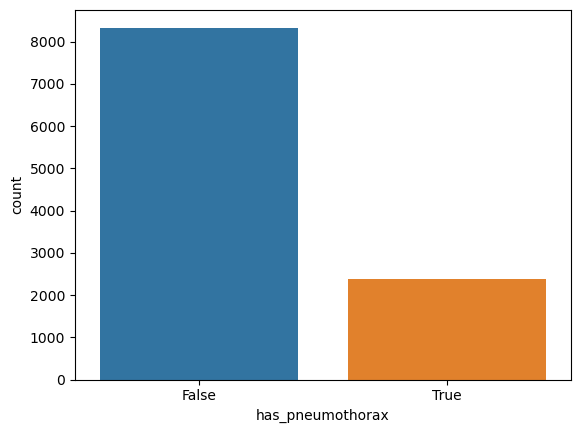

In [13]:
sns.countplot(x = train_metadata_df['has_pneumothorax'])
# this shows that the data we have is imbalance

# defining configuration parameters

In [27]:
# defining configuration parameters
img_size = 256 # image resize size
batch_size = 16 # batch size for training unet
k_size = 3 # kernel size 3x3
val_size = .25 # split of training set between train and validation set
no_pneumo_drop = 0 # dropping some data to balance the class a little bit better can be changed as per requirements

In [28]:
# getting mask data from the rle data
masks = {}
for index, row in train_metadata_df[train_metadata_df['has_pneumothorax']==1].iterrows():
    masks[row['id']] = list(row['encoded_pixels_list'])

In [29]:
# removing data with pixel count 0
bad_data = train_metadata_df[train_metadata_df['encoded_pixels_count']==0].index
train_metadata_df_removing_bad_data = train_metadata_df.drop(bad_data)

In [30]:
drop_data = train_metadata_df_removing_bad_data[train_metadata_df_removing_bad_data['has_pneumothorax'] == False].sample(no_pneumo_drop).index
train_metadata_df_removing_bad_data = train_metadata_df_removing_bad_data.drop(drop_data)

In [31]:
X_train, X_val, y_train, y_val = train_test_split(train_metadata_df_removing_bad_data.index, train_metadata_df_removing_bad_data['has_pneumothorax'].values, test_size=0.2, random_state=42)
X_train, X_val = train_metadata_df_removing_bad_data.loc[X_train]['file_path'].values, train_metadata_df_removing_bad_data.loc[X_val]['file_path'].values

In [32]:
# model param
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 1

def dice_coef_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

In [20]:
# Build U-Net model
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
s = Lambda(lambda x: x / 255) (inputs)

c1 = Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (s)
c1 = BatchNormalization()(c1)
c1 = Dropout(0.1) (c1)
c1 = Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c1)
c1 = BatchNormalization()(c1)
p1 = MaxPooling2D((2, 2)) (c1)

c2 = Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (p1)
c2 = BatchNormalization()(c2)
c2 = Dropout(0.1) (c2)
c2 = Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D((2, 2)) (c2)

c3 = Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (p2)
c3 = BatchNormalization()(c3)
c3 = Dropout(0.2) (c3)
c3 = Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)

c4 = Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (p3)
c4 = BatchNormalization()(c4)
c4 = Dropout(0.2) (c4)
c4 = Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)

c5 = Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (p4)
c5 = BatchNormalization()(c5)
c5 = Dropout(0.3) (c5)
c5 = Conv2D(512, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c5)
c5 = BatchNormalization()(c5)

u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c5)
u6 = concatenate([u6, c4])
c6 = Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (u6)
c6 = BatchNormalization()(c6)
c6 = Dropout(0.2) (c6)
c6 = Conv2D(256, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c6)
c6 = BatchNormalization()(c6)

u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
c7 = Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (u7)
c7 = BatchNormalization()(c7)
c7 = Dropout(0.2) (c7)
c7 = Conv2D(128, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c7)
c7 = BatchNormalization()(c7)

u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
c8 = Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (u8)
c8 = BatchNormalization()(c8)
c8 = Dropout(0.1) (c8)
c8 = Conv2D(64, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c8)
c8 = BatchNormalization()(c8)

u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
c9 = Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (u9)
c9 = BatchNormalization()(c9)
c9 = Dropout(0.1) (c9)
c9 = Conv2D(32, (3, 3), activation='selu', kernel_initializer='he_normal', padding='same') (c9)
c9 = BatchNormalization()(c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)
model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss=dice_coef_loss, metrics=[dice_coef])

In [21]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 1  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 256, 256, 1)  0           ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  320         ['lambda[0][0]']                 
                                )                                                                 
                                                                                              

 conv2d_transpose (Conv2DTransp  (None, 32, 32, 128)  262272     ['batch_normalization_9[0][0]']  
 ose)                                                                                             
                                                                                                  
 concatenate (Concatenate)      (None, 32, 32, 384)  0           ['conv2d_transpose[0][0]',       
                                                                  'batch_normalization_7[0][0]']  
                                                                                                  
 conv2d_10 (Conv2D)             (None, 32, 32, 256)  884992      ['concatenate[0][0]']            
                                                                                                  
 batch_normalization_10 (BatchN  (None, 32, 32, 256)  1024       ['conv2d_10[0][0]']              
 ormalization)                                                                                    
          

In [98]:
# adding model checkpoints and callbacks
checkpoint = ModelCheckpoint('best_model.hdf5' , 
                             monitor = 'val_loss', 
                             verbose = 1, 
                             save_best_only=True,
                             mode = 'min',
                             save_weights_only=True,
                             save_freq='epoch'
                            )
callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=6, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs'),
checkpoint]

In [33]:
# generating data
params = {'img_size': 256,
          'batch_size': 16,
          'channels': 1,
          'shuffle': True}

# Generators
traininggenerator = DataGenerator(X_train, masks, **params)
validationgenerator = DataGenerator(X_val, masks, **params)

In [ ]:
history= model.fit_generator(generator=traininggenerator, validation_data=validationgenerator, epochs=10,callbacks=callbacks_list,
                    verbose=1)

In [ ]:
plt.plot(history.history['loss'],color='red', label='train')
plt.plot(history.history['val_loss'],color='blue', label='validation')


In [44]:
plt.plot(hist.history['dice_coef'], color = 'red')
plt.plot(hist.history['val_dice_coef'], color = 'blue')
plt.show()

In [22]:
model.load_weights('D:\\kreeda_labs_assignment\\best_model.hdf5')

In [47]:
def plot_train(img, mask, pred):
    fig, ax = plt.subplots(nrows=1, ncols=3, sharey=True, figsize=(15, 5))

    ax[0].imshow(img, cmap=plt.cm.bone)
    ax[0].set_title('Chest X-Ray')

    ax[1].imshow(mask, cmap=plt.cm.bone)
    ax[1].set_title('Mask')

    ax[2].imshow(pred, cmap=plt.cm.bone)
    ax[2].set_title('Pred Mask')

    plt.show()

In [35]:
# lets loop over the predictions and print some good-ish results
count = 0
for i in range(0,30):
    if count <= 15:
        x, y = traininggenerator.__getitem__(i)
        predictions = model.predict(x)
        for idx, val in enumerate(x):
            if y[idx].sum() > 0 and count <= 15: 
                img = np.reshape(x[idx]* 255, (img_size, img_size))
                mask = np.reshape(y[idx]* 255, (img_size, img_size))
                pred = np.reshape(predictions[idx], (img_size, img_size))
                pred = pred > 0.5
                pred = pred * 255
                plot_train(img, mask, pred)
                count += 1

1/1 [==============================] - 2s 2s/step


# checking dice similarity coefficient for random batch

In [36]:
# Ensure both tensors have the same data type
true = tf.cast(y, tf.float64)
pred = tf.cast(predictions, tf.float64)
dice_coef(true,pred).numpy()

0.9994406923347134

# Implememting Grad-cam

In [17]:
def grad_cam(model, img,
             layer_name="block5_conv3", label_name=None,
             category_id=None):
    """Get a heatmap by Grad-CAM.

    Args:
        model: A model object, build from tf.keras 2.X.
        img: An image ndarray.
        layer_name: A string, layer name in model.
        label_name: A list or None,
            show the label name by assign this argument,
            it should be a list of all label names.
        category_id: An integer, index of the class.
            Default is the category with the highest score in the prediction.

    Return:
        A heatmap ndarray(without color).
    """
    img_tensor = np.expand_dims(img, axis=0)

    conv_layer = model.get_layer(layer_name)
    heatmap_model = Model([model.inputs], [conv_layer.output, model.output])

    with tf.GradientTape() as gtape:
        conv_output, predictions = heatmap_model(img_tensor)
        if category_id is None:
            category_id = np.argmax(predictions[0])
        if label_name is not None:
            print(label_name[category_id])
        output = predictions[:]
        grads = gtape.gradient(output, conv_output)
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
    heatmap = np.maximum(heatmap, 0)
    max_heat = np.max(heatmap)
    if max_heat == 0:
        max_heat = 1e-10
    heatmap /= max_heat

    return np.squeeze(heatmap)

In [18]:
# utility function for grad-cam
def show_imgwithheat(img, heatmap, alpha=0.4, return_array=False):
    """Show the image with heatmap.

    Args:
        img_path: string.
        heatmap: image array, get it by calling grad_cam().
        alpha: float, transparency of heatmap.
        return_array: bool, return a superimposed image array or not.
    Return:
        None or image array.
    """
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = (heatmap*255).astype("uint8")
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    superimposed_img = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)

    imgwithheat = Image.fromarray(superimposed_img)
    try:
        display(imgwithheat)
    except NameError:
        imgwithheat.show()

    if return_array:
        return superimposed_img

In [23]:
# getting information about the model layers
# here we are only including con2d layers and conv2d_transpose layer
for i in range(len(model.layers)):
    # check for convolutional layer
    if 'conv' not in model.layers[i].name:
        continue
    # get filter weights
    filters, biases = model.layers[i].get_weights()
    print("layer number",i,model.layers[i].name, filters.shape)

layer number 2 conv2d (3, 3, 1, 32)
layer number 5 conv2d_1 (3, 3, 32, 32)
layer number 8 conv2d_2 (3, 3, 32, 64)
layer number 11 conv2d_3 (3, 3, 64, 64)
layer number 14 conv2d_4 (3, 3, 64, 128)
layer number 17 conv2d_5 (3, 3, 128, 128)
layer number 20 conv2d_6 (3, 3, 128, 256)
layer number 23 conv2d_7 (3, 3, 256, 256)
layer number 26 conv2d_8 (3, 3, 256, 512)
layer number 29 conv2d_9 (3, 3, 512, 512)
layer number 31 conv2d_transpose (2, 2, 128, 512)
layer number 33 conv2d_10 (3, 3, 384, 256)
layer number 36 conv2d_11 (3, 3, 256, 256)
layer number 38 conv2d_transpose_1 (2, 2, 64, 256)
layer number 40 conv2d_12 (3, 3, 192, 128)
layer number 43 conv2d_13 (3, 3, 128, 128)
layer number 45 conv2d_transpose_2 (2, 2, 32, 128)
layer number 47 conv2d_14 (3, 3, 96, 64)
layer number 50 conv2d_15 (3, 3, 64, 64)
layer number 52 conv2d_transpose_3 (2, 2, 16, 64)
layer number 54 conv2d_16 (3, 3, 48, 32)
layer number 57 conv2d_17 (3, 3, 32, 32)
layer number 59 conv2d_18 (1, 1, 32, 1)


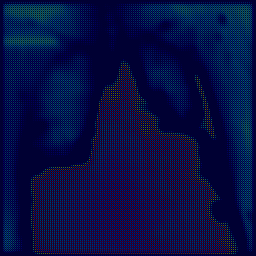

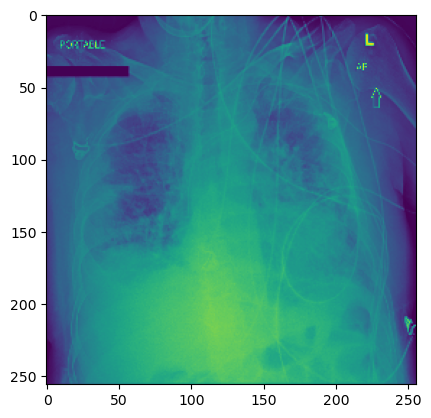

In [37]:
ht=grad_cam(model,x[10],'conv2d_transpose_3')
show_imgwithheat(x[10], ht)
plt.imshow(x[10])

# Using the model to make prediction on test daata

In [39]:
def get_test_tensor(file_path, batch_size, img_size, channels):
    
        X = np.empty((batch_size, img_size, img_size, channels))

        # Store sample
        pixel_array = pydicom.read_file(file_path).pixel_array
        image_resized = cv2.resize(pixel_array, (img_size, img_size))
        image_resized = np.array(image_resized, dtype=np.float64)
        image_resized -= image_resized.mean()
        image_resized /= image_resized.std()
        X[0,] = np.expand_dims(image_resized, axis=2)

        return X

In [40]:
test_pred = []

for i, row in test_metadata_df.iterrows():

    test_img = get_test_tensor(test_metadata_df['file_path'][i],1,img_size,1)
    
    pred_mask = model.predict(test_img).reshape((img_size,img_size))
    prediction = {}
    prediction['ImageId'] = str(test_metadata_df['id'][i])
    pred_mask = (pred_mask > .5).astype(int)
    
    
    if pred_mask.sum() < 1:
        prediction['EncodedPixels'] =  -1
    else:
        prediction['EncodedPixels'] = mask2rle(pred_mask * 255, img_size, img_size)
    test_pred.append(prediction)

1/1 [==============================] - 0s 186ms/step


1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 190ms/step


1/1 [==============================] - 0s 179ms/step


1/1 [==============================] - 0s 181ms/step


1/1 [==============================] - 0s 185ms/step


1/1 [==============================] - 0s 197ms/step


1/1 [==============================] - 0s 297ms/step


1/1 [==============================] - 0s 198ms/step


In [41]:
test_pred= pd.DataFrame(test_pred)
test_pred.columns=['ImageId','EncodedPixels']

In [42]:
test_pred.to_csv('test_pred.csv')

In [48]:
test_pred

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5797.151787519...,-1
1,1.2.276.0.7230010.3.1.4.8323329.5798.151787519...,-1
2,1.2.276.0.7230010.3.1.4.8323329.5799.151787519...,-1
3,1.2.276.0.7230010.3.1.4.8323329.580.1517875163...,-1
4,1.2.276.0.7230010.3.1.4.8323329.5800.151787519...,-1
...,...,...
1372,1.2.276.0.7230010.3.1.4.8323329.7049.151787520...,-1
1373,1.2.276.0.7230010.3.1.4.8323329.705.1517875164...,-1
1374,1.2.276.0.7230010.3.1.4.8323329.7050.151787520...,-1
1375,1.2.276.0.7230010.3.1.4.8323329.7051.151787520...,-1
